# Introduction

This experiment is to ensure the correctness of the camera metrics.

As the images should be overlapped each other, every image frame has surplus areas which should be eliminated or blended.

Our stitching approach focuses on the spherical alignment, as we know the rough position of each image frames, and this is different from other stitching methodologies that depends only visual feature points. When the positional information of image frames are absolutely correct, our approach would be really effective. Of course, this approach has disadvantages, too, and I explain its pros and cons below.

* Pros:
    1. It consumes relatively little resources - memory and time - as it doesn't find feature points and match them.
    1. It can deal with the `white wall` issue, which occures when there is no any feature points. When it is impossible to find any feature points, the prior methods have no solution, but our approch knows the rough position of that frame and it can align and blend that frame.
    1. It can work when there are large gaps between camera exposure. In indoor circumstances, there is one or two light sources and common cell phone cameras adjust its exposure automatically. This results in large difference of image exposure between adjacent frames. In this case, the precedent approaches could not find matching features and fail in stitching. But this approach can stitch them since the same reason above.
* Cons:
     1. It depends so much on the RPY values of image frames that all of its advantages would go out when the values and camera metrics are not abosolutely correct.
     1. It is likely precarious in different environments such as outdoor/indoor, sunny/cloudy, camera specification, and so on.
     
The camera metrics(mainly angle-of-view and focal length) and RPY values are vital to our approach, therefore, this experiments tries to validate the accuracy of camera metrics information and RPY values we get from the JSON file.

In [10]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [11]:
import json    
from tqdm import tqdm_notebook

import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.transforms as mptrans

from scipy import ndimage

import cv2 as cv
import imutils

import gc

In [12]:
from libpano import MetaData
from libpano import utils

### Load and parse meta data

In [13]:
ID = 'recent-04'
IMAGE_FOLDER = '../images/' + ID + '/'
JSON_FN = IMAGE_FOLDER + ID + '.json'

In [14]:
meta_data = MetaData.MetaData(IMAGE_FOLDER)
metrics = meta_data.metrics
meta = meta_data.grid_data

This is the camera metrics we calculated from the camera metrics information in JSON file.

In [17]:
print(metrics)

Camera Metrics:
	Focal Length: 4.4589 mm
	Focal Length: 1588.26 px
	Sensor Size: 4.2447996 x 5.6447997 mm
	Pixels per mm: 356.20 x 357.14 px/mm
Panorama Metrics:
	Frame Size: 1512px x 2016px
	Frame Count: 15 x 5
	Interval Angle: 24.0︒ x 36.0︒
	AoV: 50.9081︒ x 64.6661︒
	PPR: 1701.7168px x 1786.2268px
	Panorama Size: 10692.2019px x 5611.5971px



Then calculate the grid information of images from the RPY values of images.

In [32]:
# Frame center pitches
mean_pitch_per_row = meta.groupby(by='row')['pitch'].agg(np.mean)
pitch_interval = 180 / metrics.N_v
fcp = (np.round(mean_pitch_per_row / pitch_interval) * pitch_interval).values.tolist()
fcp = list(map(utils.degree2radian, fcp))
print(fcp)

# Frame center yaws
mean_yaws = meta.groupby(by='col')['yaw'].agg(np.mean)
half_yaw_interval = 180 / metrics.N_h
fcy = (np.round(mean_yaws/half_yaw_interval) * half_yaw_interval).values.tolist()
fcy = list(map(utils.degree2radian, fcy))
print(fcy)

[-1.2566370614359172, -0.6283185307179586, 0.0, 0.6283185307179586, 1.2566370614359172]
[0.20943951023931953, 0.6283185307179586, 1.0471975511965976, 1.4660765716752369, 2.0943951023931953, 2.303834612632515, 2.9321531433504737, 3.141592653589793, 3.7699111843077517, 3.979350694547071, 4.39822971502571, 4.817108735504349, 5.235987755982989, 5.654866776461628, 6.073745796940266]


Now, let's see the image grid each frame's ROI(region of interest).

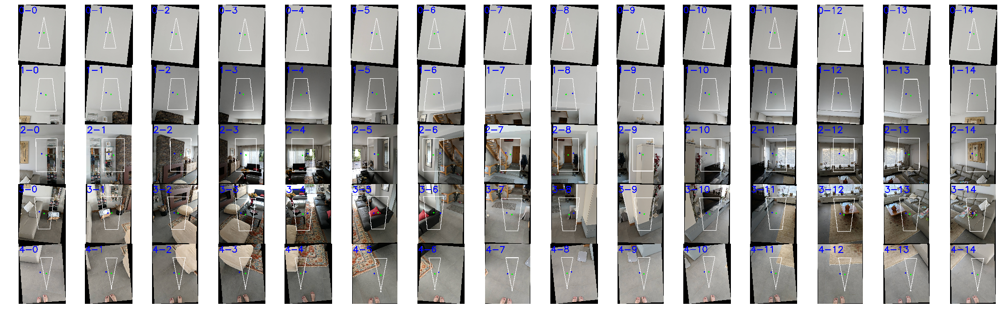

In [34]:
_, ax = plt.subplots(metrics.N_v, metrics.N_h, figsize=(30,9))
plt.subplots_adjust(left=0, right=0.99, bottom=0, top=0.99, wspace=0, hspace=0)

for row in range(metrics.N_v):
    
    for col in range(metrics.N_h):
        # get image data
        any_row = meta.loc[(meta.row == row) & (meta.col == col)]

        p = utils.degree2radian(any_row['pitch'].iloc[0])
        y = utils.degree2radian(any_row['yaw'].iloc[0])
        roll = any_row['roll'].iloc[0]

        # load image
        img = cv.imread(IMAGE_FOLDER + any_row['uri'].iloc[0])
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        y_frame, x_frame, _ = img.shape
        
        # rotate image by its roll
        img = imutils.rotate_bound(img, roll)

        # physical center - blue point
        image_cx = x_frame // 2
        image_cy = y_frame // 2
        cv.circle(img, (image_cx, image_cy), 5, (0, 0, 255), 40)

        # spherical center - green point
        cx = int( image_cx + (y - fcy[col]) * metrics.PPR_h )
        cy = int( image_cy + (p - fcp[row]) * metrics.PPR_v )
        cv.circle(img, (cx, cy), 5, (0, 255, 0), 40)
        
        # ROI - region which would be shown in the panorama.
        dy = int( metrics.R_v * metrics.FIA_v / 2 )
        dx = int( metrics.R_v * math.cos(p - metrics.FIA_v/2) * metrics.FIA_h / 2 )
        dx1 = int( metrics.R_v * math.cos(p + metrics.FIA_v/2) * metrics.FIA_h / 2 )

        pts = np.array([[cx-dx, cy-dy], [cx+dx, cy-dy],[cx+dx1,cy+dy],[cx-dx1,cy+dy]], np.int32)
        pts = pts.reshape((-1,1,2))

        cv.polylines(img, [pts], True, (255, 255, 255), 15)
        
        cv.putText(img, "{}-{}".format(row, col), (20, 300), cv.FONT_HERSHEY_SIMPLEX, 10, (0, 0, 255), 30, cv.LINE_AA)
#         cv.putText(img, "Yaw  = " + str(any_row['yaw'].iloc[0]), (50, 150), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv.LINE_AA)
#         cv.putText(img, "Roll = " + str(any_row['roll'].iloc[0]), (50, 200), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv.LINE_AA)

        ax_cur = ax[row][col]
        ax_cur.imshow(img)
        ax_cur.axis('off')

        del img
        
plt.show()

* Pitch values look correct when we consider the 2nd and 3rd rows.
* Yaw values are far from the correctness.
* Roll values looks correct.

Let's see in detail.

In [35]:
gc.collect()

115604

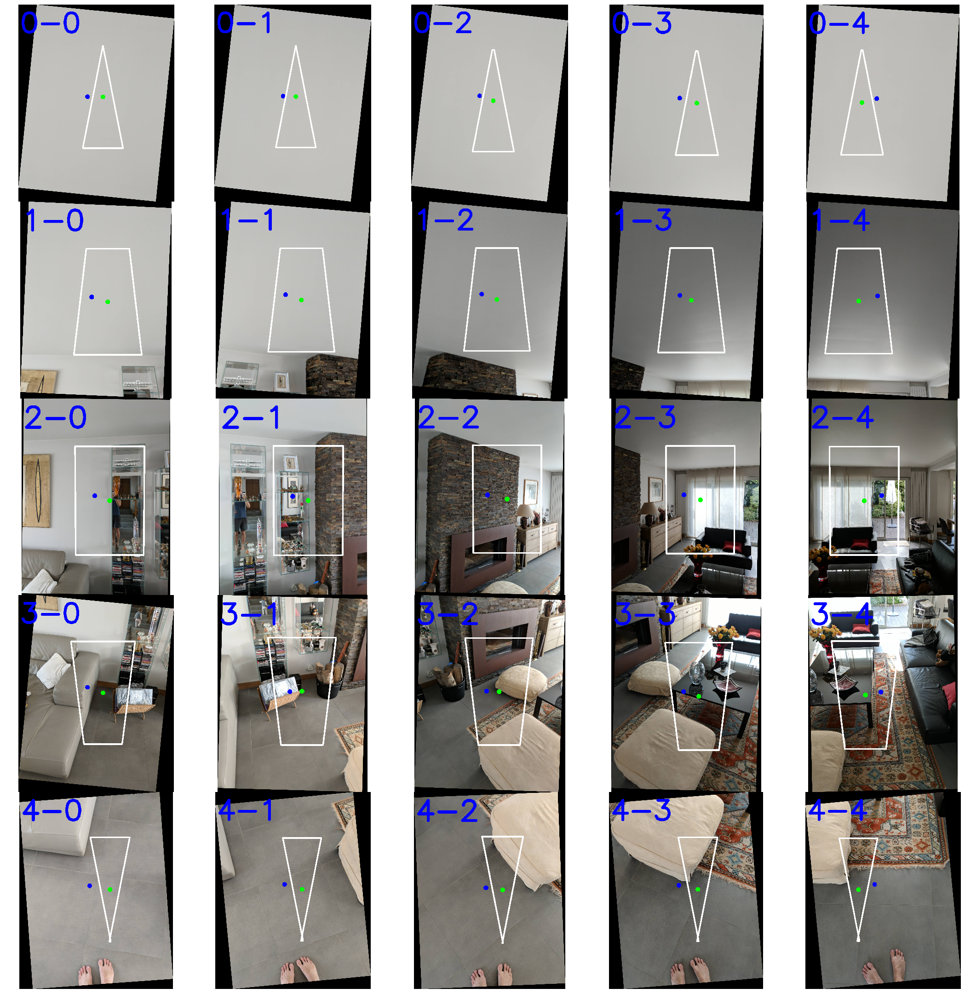

In [36]:
_, ax = plt.subplots(metrics.N_v, metrics.N_h//3, figsize=(30, 30))
plt.subplots_adjust(left=0, right=0.99, bottom=0, top=0.99, wspace=0, hspace=0)

for row in range(metrics.N_v):
    
    for col in range(metrics.N_h//3):
        # get image data
        any_row = meta.loc[(meta.row == row) & (meta.col == col)]

        p = utils.degree2radian(any_row['pitch'].iloc[0])
        y = utils.degree2radian(any_row['yaw'].iloc[0])
        roll = any_row['roll'].iloc[0]

        # load image
        img = cv.imread(IMAGE_FOLDER + any_row['uri'].iloc[0])
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        y_frame, x_frame, _ = img.shape
        
        # rotate image by its roll
        img = imutils.rotate_bound(img, roll)

        # physical center - blue point
        image_cx = x_frame // 2
        image_cy = y_frame // 2
        cv.circle(img, (image_cx, image_cy), 5, (0, 0, 255), 40)

        # spherical center - green point
        cx = int( image_cx + (y - fcy[col]) * metrics.PPR_h )
        cy = int( image_cy + (p - fcp[row]) * metrics.PPR_v )
        cv.circle(img, (cx, cy), 5, (0, 255, 0), 40)
        
        # ROI - region which would be shown in the panorama.
        dy = int( metrics.R_v * metrics.FIA_v / 2 )
        dx = int( metrics.R_v * math.cos(p - metrics.FIA_v/2) * metrics.FIA_h / 2 )
        dx1 = int( metrics.R_v * math.cos(p + metrics.FIA_v/2) * metrics.FIA_h / 2 )

        pts = np.array([[cx-dx, cy-dy], [cx+dx, cy-dy],[cx+dx1,cy+dy],[cx-dx1,cy+dy]], np.int32)
        pts = pts.reshape((-1,1,2))

        cv.polylines(img, [pts], True, (255, 255, 255), 15)
        
        cv.putText(img, "{}-{}".format(row, col), (20, 300), cv.FONT_HERSHEY_SIMPLEX, 10, (0, 0, 255), 30, cv.LINE_AA)

        ax_cur = ax[row][col]
        ax_cur.imshow(img)
        ax_cur.axis('off')

        del img
        
plt.show()

## Don't move by pitch and yaw

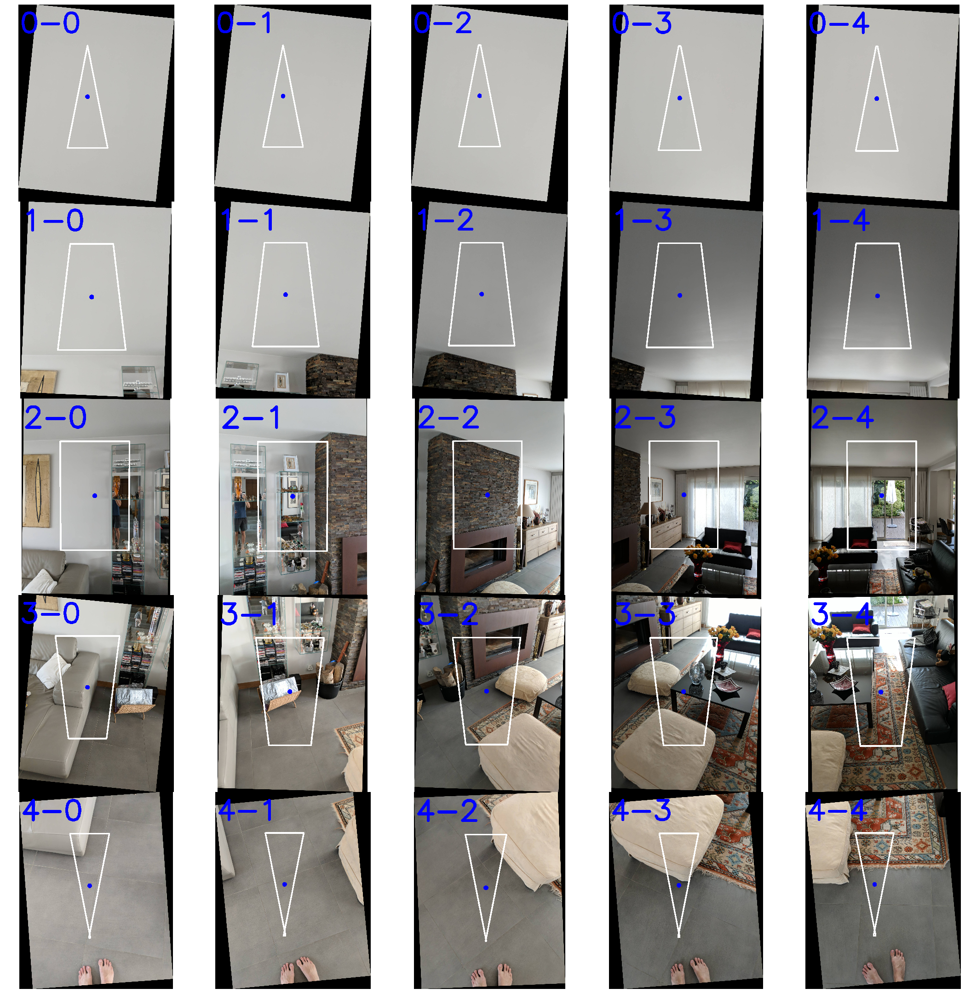

In [37]:
_, ax = plt.subplots(metrics.N_v, metrics.N_h//3, figsize=(30, 30))
plt.subplots_adjust(left=0, right=0.99, bottom=0, top=0.99, wspace=0, hspace=0)

for row in range(metrics.N_v):
    
    for col in range(metrics.N_h//3):
        # get image data
        any_row = meta.loc[(meta.row == row) & (meta.col == col)]

        p = utils.degree2radian(any_row['pitch'].iloc[0])
        y = utils.degree2radian(any_row['yaw'].iloc[0])
        roll = any_row['roll'].iloc[0]

        # load image
        img = cv.imread(IMAGE_FOLDER + any_row['uri'].iloc[0])
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        y_frame, x_frame, _ = img.shape
        
        # rotate image by its roll
        img = imutils.rotate_bound(img, roll)

        # physical center - blue point
        image_cx = x_frame // 2
        image_cy = y_frame // 2
        cv.circle(img, (image_cx, image_cy), 5, (0, 0, 255), 40)

        # spherical center - green point
#         cx = int( image_cx + (y - fcy[col]) * metrics.PPR_h )
#         cy = int( image_cy + (p - fcp[row]) * metrics.PPR_v )
#         cv.circle(img, (cx, cy), 5, (0, 255, 0), 40)
        cx = image_cx
        cy = image_cy
        
        # ROI - region which would be shown in the panorama.
        dy = int( metrics.R_v * metrics.FIA_v / 2 )
        dx = int( metrics.R_v * math.cos(p - metrics.FIA_v/2) * metrics.FIA_h / 2 )
        dx1 = int( metrics.R_v * math.cos(p + metrics.FIA_v/2) * metrics.FIA_h / 2 )

        pts = np.array([[cx-dx, cy-dy], [cx+dx, cy-dy],[cx+dx1,cy+dy],[cx-dx1,cy+dy]], np.int32)
        pts = pts.reshape((-1,1,2))

        cv.polylines(img, [pts], True, (255, 255, 255), 15)
        
        cv.putText(img, "{}-{}".format(row, col), (20, 300), cv.FONT_HERSHEY_SIMPLEX, 10, (0, 0, 255), 30, cv.LINE_AA)

        # perspective warping
        dx = max(dx, 20)
        dx1 = max(dx1, 20)
        src_pts = np.array([[cx-dx, cy-dy], [cx+dx, cy-dy],[cx+dx1,cy+dy],[cx-dx1,cy+dy]], np.int32)
        mdx = max(dx, dx1)
        dst_pts = np.array([[cx-mdx, cy-dy], [cx+mdx, cy-dy],[cx+mdx,cy+dy],[cx-mdx,cy+dy]], np.int32)
        h, status = cv.findHomography(src_pts, dst_pts)
#         img = cv.warpPerspective(img, h, (2*x_frame, 2*y_frame))

        ax_cur = ax[row][col]
        ax_cur.imshow(img)
        ax_cur.axis('off')

        del img

# Conclusion

From the experiment above, I've got the following conclusion:

1. Roll values are not absolutely correct.
1. Pitch and yaw values are some erroneous and some correct. In a word, it's accuracy is low.
1. Camera metrics are not correct, especially, PPR is small.

**Then, what shall I do?**
1. Use roll value to rotate the frame.
2. Move the ROI according to the pitch and yaw value.
3. Expand the ROI. This would fill the gaps due to the small PPR and error pitch/yaw. Then how much?
